In [1]:
!pip install folium==0.2.1

! [ -e /content ] && pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 69 kB 1.6 MB/s 
  Created wheel for folium: filename=folium-0.2.1-py3-none-any.whl size=79808 sha256=ed92fb0ec2442a930ebd64f1d59e796949944a595b278b8687b75db8bf9ebbfa
  Stored in directory: /root/.cache/pip/wheels/9a/f0/3a/3f79a6914ff5affaf50cabad60c9f4d565283283c97f0bdccf
Successfully built folium
  Attempting uninstall: folium
    Found existing installation: folium 0.8.3
    Uninstalling folium-0.8.3:
      Successfully uninstalled folium-0.8.3
     |████████████████████████████████| 719 kB 4.8 MB/s 
     |████████████████████████████████| 4.4 MB 25.7 MB/s 
     |████████████████████████████████| 362 kB 36.6 MB/s 
     |████████████████████████████████| 1.2 MB 35.6 MB/s 
     |████████████████████████████████| 1.1 MB 45.6 MB/s 
     |████████████████████████████████| 140 kB 51.4 MB/s 
     |████████████████████████████████| 212 kB 55.8 MB/s 
     

In [47]:
from fastbook import *
from fastai.vision.widgets import *

In [48]:
import os
#from dotenv import load_dotenv
#from dotenv import dotenv_values
#load_dotenv()
#dotenv_values()
#key = os.getenv('AZURE_SEARCH_KEY')


In [5]:
search_images_bing

<function fastbook.search_images_bing>

In [6]:
results = search_images_bing(key, 'russian tortoise')
ims = results.attrgot('contentUrl')
len(ims)

150

In [7]:
im1 = ims[1]

In [9]:
dest = 'images/russian.jpg'
download_url(ims[0], dest)

Path('images/russian.jpg')

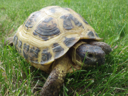

In [10]:
im = Image.open(dest)
im.to_thumb(128,128)

In [11]:
tortoise_types = 'russian','sulcata','egyptian','hermann\'s','red-footed','leopard','galapagos giant'
path = Path('tortoises')


In [12]:
if not path.exists():
    path.mkdir()
    for o in tortoise_types:
        dest = (path/o)
        dest.mkdir(exist_ok=True)
        results = search_images_bing(key, f'{o} tortoise')
        download_images(dest, urls=results.attrgot('contentUrl'))

In [13]:
fns = get_image_files(path)
fns

(#990) [Path('tortoises/red-footed/00000058.jpg'),Path('tortoises/red-footed/00000131.jpg'),Path('tortoises/red-footed/00000123.jpg'),Path('tortoises/red-footed/00000012.jpg'),Path('tortoises/red-footed/00000115.jpg'),Path('tortoises/red-footed/00000063.jpg'),Path('tortoises/red-footed/00000019.jpg'),Path('tortoises/red-footed/00000049.jpg'),Path('tortoises/red-footed/00000138.jpg'),Path('tortoises/red-footed/00000038.jpg')...]

In [14]:
failed = verify_images(fns)
failed

(#7) [Path('tortoises/red-footed/00000053.jpg'),Path('tortoises/red-footed/00000085.png'),Path("tortoises/hermann's/00000058.jpg"),Path('tortoises/galapagos giant/00000088.jpg'),Path('tortoises/galapagos giant/00000036.jpg'),Path('tortoises/galapagos giant/00000003.jpg'),Path('tortoises/leopard/00000053.jpg')]

In [15]:
failed.map(Path.unlink);

In [16]:
tortoises = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

In [17]:
dls = tortoises.dataloaders(path)

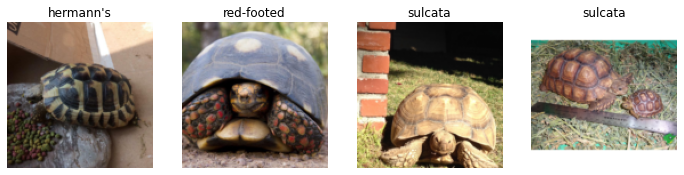

In [18]:
dls.valid.show_batch(max_n=4, nrows=1)

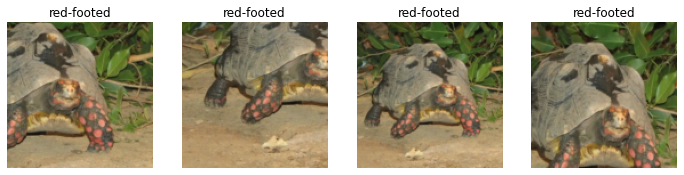

In [19]:
tortoises = tortoises.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dls = tortoises.dataloaders(path)
dls.train.show_batch(max_n=4, nrows=1, unique=True)

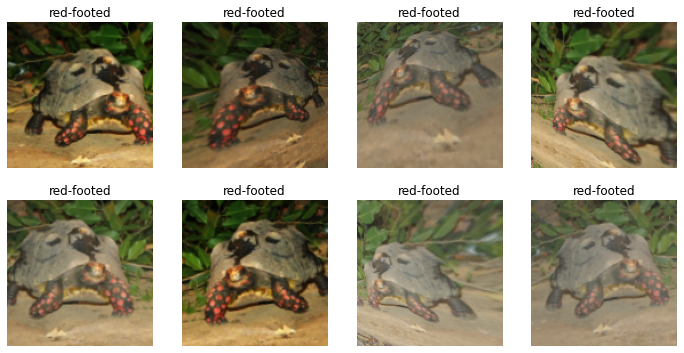

In [20]:
tortoises = tortoises.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))
dls = tortoises.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

In [21]:
tortoises = tortoises.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = tortoises.dataloaders(path, num_workers=1)

In [22]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

epoch,train_loss,valid_loss,error_rate,time
0,2.472080,1.021846,0.311224,03:06


epoch,train_loss,valid_loss,error_rate,time
0,1.178095,0.703202,0.224490,04:07
1,0.942884,0.572832,0.173469,04:05
2,0.771121,0.549311,0.178571,04:07
3,0.653939,0.545919,0.178571,04:05


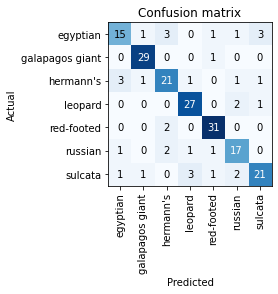

In [23]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

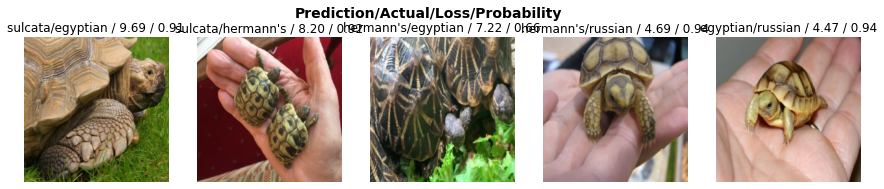

In [24]:
interp.plot_top_losses(5, nrows=1)

In [25]:
cleaner = ImageClassifierCleaner(learn)
cleaner

In [26]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()

In [27]:
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

In [83]:
learn.export()


In [84]:
path = Path()
path.ls(file_exts='.pkl')


(#1) [Path('export.pkl')]

In [51]:
learn_inf = load_learner(path/'export.pkl')

In [52]:
learn_inf.dls.vocab

['egyptian', 'galapagos giant', "hermann's", 'leopard', 'red-footed', 'russian', 'sulcata']

In [56]:
learn_inf.predict("/content/images/russian.jpg")

('russian',
 TensorBase(5),
 TensorBase([9.2972e-07, 8.7842e-05, 2.0567e-03, 3.0908e-04, 1.0410e-05, 9.9713e-01, 4.0061e-04]))

In [64]:
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

In [65]:
btn_upload = SimpleNamespace(data =['/content/images/russian.jpg'])

In [67]:
img = PILImage.create(btn_upload.data[-1])

In [68]:
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl: display(img.to_thumb(128,128))
out_pl

Output()

In [69]:
pred,pred_idx,probs = learn_inf.predict(img)

In [70]:
lbl_pred = widgets.Label()
lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
lbl_pred

Label(value='Prediction: russian; Probability: 0.9971')

In [80]:
btn_run = widgets.Button(description='Get Tortoise Type')
btn_run

Button(description='Get Tortoise Type', style=ButtonStyle())

In [73]:
def on_click_classify(change):
    img = PILImage.create(btn_upload.data[-1])
    out_pl.clear_output()
    with out_pl: display(img.to_thumb(128,128))
    pred,pred_idx,probs = learn_inf.predict(img)
    lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

btn_run.on_click(on_click_classify)

In [74]:
btn_upload = widgets.FileUpload()

In [81]:
VBox([widgets.Label('Let\'s see the tortoise! Click "Upload" to choose a pic from your device:'), 
      btn_upload, btn_run, out_pl, lbl_pred])

In [82]:
!pip install voila
!jupyter serverextension enable --sys-prefix voila

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.7 MB 5.5 MB/s 
     |████████████████████████████████| 561 kB 46.4 MB/s 
     |████████████████████████████████| 112 kB 42.7 MB/s 
     |████████████████████████████████| 54 kB 2.3 MB/s 
     |████████████████████████████████| 344 kB 48.5 MB/s 
     |████████████████████████████████| 132 kB 47.6 MB/s 
     |████████████████████████████████| 70 kB 7.0 MB/s 
     |████████████████████████████████| 423 kB 42.7 MB/s 
     |████████████████████████████████| 80 kB 8.0 MB/s 
     |████████████████████████████████| 54 kB 2.3 MB/s 
     |████████████████████████████████| 133 kB 49.8 MB/s 
  Created wheel for json5: filename=json5-0.9.8-py2.py3-none-any.whl size=18604 sha256=037b7ee84efbff54baf953d63f91b797513885b97644d7c606333fb90699848c
  Stored in directory: /root/.cache/pip/wheels/ac/9b/de/6e4fd8f159d3dfa42c42ceddf2184fda29ea7fb1e8f5f8371c
Successfully 

Enabling: voila
- Writing config: /usr/etc/jupyter
    - Validating...
      voila  OK
